# **Previsão de Preços de Apartamentos**

## **Apresentação**

O objetivo desde projeto é aplicar ténicas de Machine Learning para determinar o valor de um apartamento na cidade de São Paulo.

Nosso modelo receberá um conjunto de dados sobre imóveis existentes com suas características, e com esse conjunto de dados o modelo deverá aprender a estimar o valor do imóvel com base em dados fora do conjunto utilizado para seu treinamento

## **Sobre os Dados utilizados**

O conjunto de dados utilizados neste projeto foi extraído do Kaggle no endereço: <https://www.kaggle.com/datasets/argonalyst/sao-paulo-real-estate-sale-rent-april-2019?select=sao-paulo-properties-april-2019.csv>.

O conjunto de dados possui cerca de 13 mil apartamentos para venda e locação na cidade de São Paulo e, segundo o autor, estes dados foram extraídos multiplas fontes, especialmente de websites de classificados.


Variáveis presentes:

* Price - Preço final em Reais;
* Condo - Valores de Condominio em Reais;
* Size - Tamanho em m² do imóvel (apenas área privadas);
* Rooms - Números de quartos;
* Toilets - Número de banheiros
* Suites - Número de suítes 
* Parking - Número de vagas de estacionamento
* Elevator - Classificação binária: 1 - Tem elevador | 0 - Não tem
* Furnished - Classifação binária: 1 - Mobiliado | 0 - Não mobiliado
* Swimming Pool - Classificação binária: 1 - Tem piscina | 0 - Não tem piscina
* New - Classificação Binária: 1 - Imóvel Novo | 0 - Imóvel Usado

## **Bibliotecas Utilizadas**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error

import joblib


import warnings
warnings.filterwarnings('ignore')


## **Carregando o Conjunto de Dados**

In [2]:
data = pd.read_csv('./data/sao-paulo-properties-april-2019.csv')

# Visualizar as três primeiras linhas do dataset:
data.head(3)

,Price,Condo,Size,Rooms,Toilets,Suites,Parking,Elevator,Furnished,Swimming Pool,New,District,Negotiation Type,Property Type,Latitude,Longitude
0,930,220,47,2,2,1,1,0,0,0,0,Artur Alvim/São Paulo,rent,apartment,-23.543138,-46.479486
1,1000,148,45,2,2,1,1,0,0,0,0,Artur Alvim/São Paulo,rent,apartment,-23.550239,-46.480718
2,1000,100,48,2,2,1,1,0,0,0,0,Artur Alvim/São Paulo,rent,apartment,-23.542818,-46.485665


## **Análise Exploratória dos Dados**

Nesta etapa vamos analisar o conjunto de dados e suas variáveis.

Vamos procurar se existem dados ausentes, dados que não serão uteis para nosso problema.

In [3]:
# Verificar Número de dados ausentes:

print(f'Número de dados ausentes: {data.isna().sum().sum()}')

Número de dados ausentes: 0


In [4]:
# Informações sobre os dados:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13640 entries, 0 to 13639
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Price             13640 non-null  int64  
 1   Condo             13640 non-null  int64  
 2   Size              13640 non-null  int64  
 3   Rooms             13640 non-null  int64  
 4   Toilets           13640 non-null  int64  
 5   Suites            13640 non-null  int64  
 6   Parking           13640 non-null  int64  
 7   Elevator          13640 non-null  int64  
 8   Furnished         13640 non-null  int64  
 9   Swimming Pool     13640 non-null  int64  
 10  New               13640 non-null  int64  
 11  District          13640 non-null  object 
 12  Negotiation Type  13640 non-null  object 
 13  Property Type     13640 non-null  object 
 14  Latitude          13640 non-null  float64
 15  Longitude         13640 non-null  float64
dtypes: float64(2), int64(11), object(3)
memo

Todas as varíaveis estão em conformidade com seu tipo de dado.

In [5]:
# Verificar quantos tipos de Negotiation Type possuimos:
data['Negotiation Type'].value_counts()

rent    7228
sale    6412
Name: Negotiation Type, dtype: int64

### **Visualizando a distribuição dos imóveis através de um mapa**

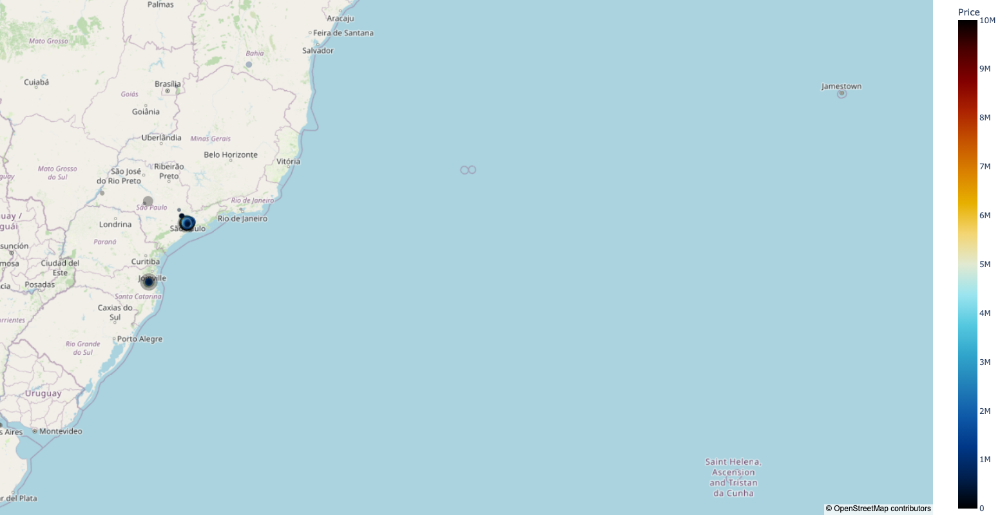

In [6]:
# Visualizando os imóveis no mapa para verificar se estão localizados apenas
# na cidade de São Paulo

fig = px.scatter_mapbox(
    data,
    lat="Latitude",
    lon="Longitude",
    hover_name="District",
    hover_data=['Size','Price'],
    color_continuous_scale=px.colors.cyclical.IceFire,
    zoom=1,
    height=800,
    size='Size',
    color='Price',
    opacity=.3,)
    #color_continuous_scale=px.colors.cyclical.IceFire)
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.update_layout(mapbox_bounds={"west": -58.37, "east": 0, "south": -46.66, "north": 0})
fig.show()

Conforme visualizado acima, exitem vários imóveis fora da localidade da cidade de São Paulo.

Vamos coletar a latitude e longitude reais da cidade de São Paulo para filtrar nosso conjunto de dados.

In [7]:
# dados coletos no site http://datageo.ambiente.sp.gov.br/geoportal/catalog/search/resource/details.page?uuid=%7B10787319-DEDC-42F7-BB0A-36CA918C4B82%7D#:~:text=Longitude%20Oeste%3A%20%2D46.84,Latitude%20Sul%3A%20%2D24.00

Longitude_Oeste= -46.84
Longitude_Leste= -46.36
Latitude_Norte= -23.36
Latitude_Sul= -24.00

# Criando o filtro
data_filtered = data[(data['Longitude'] >= Longitude_Oeste) & (data['Longitude']<=Longitude_Leste) &\
     (data['Latitude'] <= Latitude_Norte) & (data['Latitude']>=Latitude_Sul)]

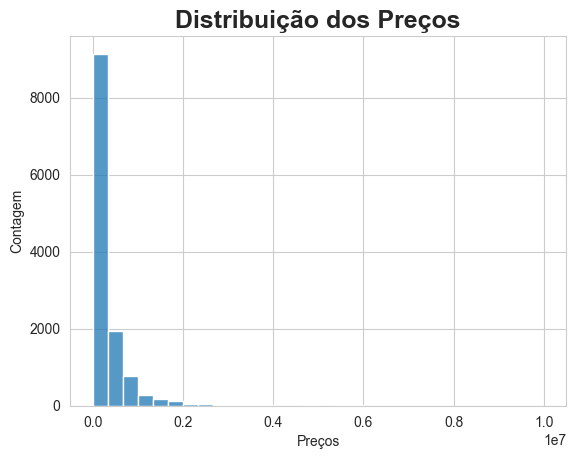

In [43]:
ax = sns.histplot(data=data_filtered['Price'], bins=30)
plt.title('Distribuição dos Preços', fontsize=18, weight='bold')
ax.set(ylabel='Contagem', xlabel='Preços')
plt.show()

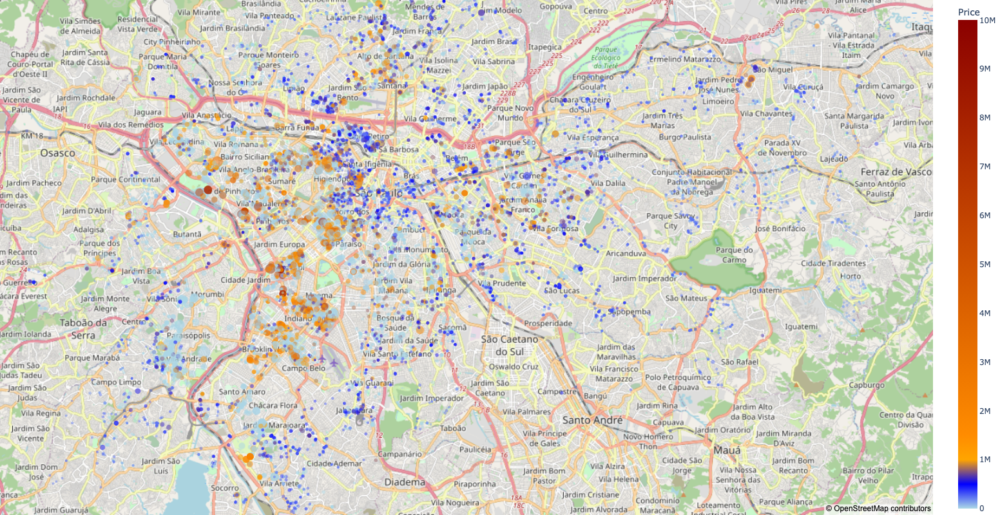

In [9]:
fig = px.scatter_mapbox(
    data_filtered,
    lat="Latitude",
    lon="Longitude",
    hover_name="District",
    hover_data=['Size','Price'],
    color_continuous_scale=px.colors.cyclical.IceFire,
   
    height=800,
    size='Size',
    color='Price',
    size_max=15,
    opacity=.5,)
fig.update_coloraxes(colorscale = [
                                    [0,  'lightblue'],
                                    [0.05, 'blue'],
                                    [0.10, 'orange'],
                                    [0.15, 'darkorange'],
                                    [1, 'darkred'],
                                    ])
fig.update_layout(mapbox_style='open-street-map',)
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.update_layout(mapbox_bounds={"west": -46.82, "east": -46.36, "south": -23.76, "north": -23.4})
fig.show()

Conforme mapa acima, o problema dos imóveis fora da cidade de São Paulo foi solucionado.

In [10]:
# Verificar se existe outro tipo de propriedade, além de apartamentos:

data_filtered['Property Type'].value_counts()

apartment    12649
Name: Property Type, dtype: int64

Acima verificamos que no tipo de negociação temos duas situações: Rent (aluguel) e Sale (venda).
Outro dado interessante é que neste conjunto de dados possuímos apenas tipo de propriedade Apartamento.

Por trata-se de uma apresentação de como funcionam os modelos, vamos utilizar apenas os dados de aluguel. Criando um dataframe exclusivo para as negociações Rent.

Antes disso, vamos separar os bairros da coluna District.


In [11]:
# Separando o bairro da cidade:

data_filtered[['District','City']] = data_filtered.District.str.split('/',expand=True)

In [12]:
# Criando os conjuntos de dados Sale e Rent:

data_rent = data_filtered[data_filtered['Negotiation Type'] == 'rent']


In [13]:
# Verificando estatisticas descritivas de dados numéricos - conjunto aluguel:

data_rent.describe()

,Price,Condo,Size,Rooms,Toilets,Suites,Parking,Elevator,Furnished,Swimming Pool,New,Latitude,Longitude
count,6710.000000,6710.000000,6710.000000,6710.000000,6710.000000,6710.000000,6710.000000,6710.000000,6710.000000,6710.000000,6710.000000,6710.000000,6710.000000
mean,3108.932936,834.526677,90.067660,2.315201,2.140238,1.055440,1.464680,0.313562,0.175112,0.490015,0.000596,-23.564606,-46.639950
std,3580.506472,845.081109,63.981211,0.827349,0.994323,0.872851,0.888737,0.463975,0.380091,0.499938,0.024410,0.051650,0.078195
min,480.000000,0.000000,30.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-23.755266,-46.812860
25%,1380.000000,399.250000,52.000000,2.000000,2.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,-23.599557,-46.692328
50%,2000.000000,600.000000,68.000000,2.000000,2.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,-23.560123,-46.651914
75%,3300.000000,1000.000000,101.000000,3.000000,2.000000,1.000000,2.000000,1.000000,0.000000,1.000000,0.000000,-23.530751,-46.601607
max,50000.000000,9500.000000,880.000000,10.000000,8.000000,5.000000,9.000000,1.000000,1.000000,1.000000,1.000000,-23.394787,-46.367814


In [14]:
data_rent['New'].value_counts()

0    6706
1       4
Name: New, dtype: int64

Analisando as estatisticas descritivas acima, não localizamos nenhuma anomalia nos valores. 

Também verificamos que dos 6710 imóveis, apenas 4 imóveis estão marcados como novos. No momento da preparação dos dados para o modelo de aprendizado da máquina, esta variável deverá ser descartado pela irrelevância que ele terá na modelagem.

### **Correlação**

In [15]:
data_rent.corr()['Price'].sort_values(ascending=False)

Price            1.000000
Size             0.733309
Condo            0.699262
Parking          0.639955
Suites           0.584516
Toilets          0.579534
Rooms            0.387048
Swimming Pool    0.201180
Furnished        0.170409
Elevator         0.030560
New             -0.009014
Latitude        -0.137138
Longitude       -0.216787
Name: Price, dtype: float64

## **Modelos de Aprendizado de Máquina para Prever o Preço de Imóveis**

Neste projeto, quatro modelos de aprendizado de máquina foram utilizados para prever o preço de imóveis com base em diversas características dos imóveis:

### **Regressão Linear**
A regressão linear é um modelo de aprendizado supervisionado que se baseia na ideia de que há uma relação linear entre as características dos imóveis e seu preço. Neste modelo, a previsão do preço é feita por meio de uma equação matemática simples que relaciona cada característica ao preço.

### **Árvore de Decisão**
A árvore de decisão é um modelo de aprendizado supervisionado que funciona dividindo o conjunto de dados em subconjuntos com base em condições de decisão. Cada nó da árvore representa uma decisão e as folhas representam o preço previsto.

### **Random Forest**
O random forest é uma técnica de aprendizado de máquina baseada em árvores de decisão. A ideia é criar várias árvores de decisão com subconjuntos aleatórios dos dados e fazer uma previsão média para obter uma previsão mais robusta e precisa.

Todos os três modelos foram treinados com o mesmo conjunto de dados e suas previsões foram comparadas utilizando a métrica de erro absoluto médio. O modelo com o menor erro absoluto médio foi considerado o melhor modelo para prever o preço dos imóveis.

## **Preparação dos dados para o Modelo**

Abaixo vamos começar a trabalhar com os dados de aluguel. Neste primeiro momento será feito a adequação dos dados para que possamos passá-los ao algoritimo e começarmos assim a modelagem.

Seguiremos os passos abaixo:

1. Excluir as colunas New, Negotiation Type, Property Type. 

    - Essas colunas possuem valores únicos e não tem por que utilizá-lo;
    
    - Neste momento vamos manter os dados de Latitude e Longitude, para verificar o quanto influenciam nossas previsões;
2. Ajustar a coluna District
    - Como são valores categóricos, vamos transformá-lo em números pois alguns modelos exigem. Mas se transformassemos ele em uma escala de 1 a 94 (números de distritos), alguns algoritimos poderiam considerá-los como números e dar importancia indevida ao seu valor. Então vamos tranforma-los em colunas com o nome dos bairros e receberão valores booleanos (0 ou 1).

In [16]:
data_rent.head(1)

,Price,Condo,Size,Rooms,Toilets,Suites,Parking,Elevator,Furnished,Swimming Pool,New,District,Negotiation Type,Property Type,Latitude,Longitude,City
0,930,220,47,2,2,1,1,0,0,0,0,Artur Alvim,rent,apartment,-23.543138,-46.479486,São Paulo


In [17]:
# Dados aluguel
# Retirar as colunas que não serão utilizadas:

data_rent_cleaned = data_rent.drop(['New','Negotiation Type','Property Type', 'City'], axis='columns')

In [18]:
df_dummies = pd.get_dummies(data_rent_cleaned['District'],drop_first=False)
data_rent_cleaned = data_rent_cleaned.drop('District', axis='columns').join(df_dummies)

In [19]:
data_rent_cleaned.head()

,Price,Condo,Size,Rooms,Toilets,Suites,Parking,Elevator,Furnished,Swimming Pool,...,Vila Jacuí,Vila Leopoldina,Vila Madalena,Vila Maria,Vila Mariana,Vila Matilde,Vila Olimpia,Vila Prudente,Vila Sônia,Água Rasa
0,930,220,47,2,2,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1000,148,45,2,2,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1000,100,48,2,2,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1000,200,48,2,2,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1300,410,55,2,2,1,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0


## **Treinando o Modelo**

Com os dados já preparados, vamos começar o treinamento dos modelos.

1. Separamos as variáveis independentes (X) e a variável alvo - Preço (y);
2. Após essa segmentação, vamos dividir os dados em Treino e Teste. 70% dos dados serão utilizados para treinar o algoritimo, e 30%serão utilizados para testar e avaliar seu desempenho.
3. Iremos avaliar o desempenho dos algoritimos utilizando Métricas como Mean Squared Error e Mean Absolute Error.

In [20]:
# Definindo a variável alvo e variaveis independentes:

y = data_rent_cleaned['Price']
X = data_rent_cleaned.drop('Price', axis='columns')

In [21]:
# Separando dados de treino e dados de test:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.3, random_state=99)

In [22]:
# Instanciando os modelos:

model_lr = LinearRegression()
model_dt = DecisionTreeRegressor()
model_rf = RandomForestRegressor()

In [23]:
# Definindo os parametros parao gridsearchcv:

param_grid_lr = {}
param_grid_dt = {'max_depth':[5,10,15,20,None], 
                'min_samples_leaf':[1,2,4,6]}
param_grid_rf = {'n_estimators':[10,50,100],
                'max_depth' : [5,10,15,20,None],
                'min_samples_leaf' : [1,2,4,6]}

In [24]:
# Criando as instancias do GridSearch:

grid_lr = GridSearchCV(model_lr, param_grid_lr, cv=5)
grid_dt = GridSearchCV(model_dt, param_grid_dt, cv=5)
grid_rf = GridSearchCV(model_rf, param_grid_rf, cv=5)

In [25]:
# Treinando os modelos:
grid_lr.fit(X_train, y_train)
grid_dt.fit(X_train, y_train)
grid_rf.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [5, 10, 15, 20, None],
                         'min_samples_leaf': [1, 2, 4, 6],
                         'n_estimators': [10, 50, 100]})

In [26]:
# Avaliando o desempenho dos modelos com os dados de teste:

y_pred_LR = grid_lr.predict(X_test)
y_pred_DT = grid_dt.predict(X_test)
y_pred_RF = grid_rf.predict(X_test)
print(f'Linear Regression -  MSE: {mean_squared_error(y_test, y_pred_LR).round(2)} | MAE: {mean_absolute_error(y_test, y_pred_LR).round(2)} | Best Score : {grid_lr.best_score_.round(2)}')
print(f'Decision Tree -  MSE: {mean_squared_error(y_test, y_pred_DT).round(2)} | MAE: {mean_absolute_error(y_test, y_pred_DT.round(2))} | Best Score : {grid_dt.best_score_.round(2)}')
print(f'Random Forest - MSE: {mean_squared_error(y_test, y_pred_RF).round(2)} | MAE: {mean_absolute_error(y_test, y_pred_RF).round(2)} | Best Score : {grid_rf.best_score_.round(2)}')

Linear Regression -  MSE: 3224450.66 | MAE: 1013.28 | Best Score : 0.68
Decision Tree -  MSE: 3544516.73 | MAE: 883.3024739195232 | Best Score : 0.59
Random Forest - MSE: 2470387.39 | MAE: 697.01 | Best Score : 0.73


In [27]:
# Encontrando o melhor modelo

best_model = grid_lr.best_estimator_
best_params = grid_lr.best_params_
if grid_dt.best_score_ > grid_lr.best_score_:
    best_model = grid_dt.best_estimator_
    best_params = grid_dt.best_params_
if grid_rf.best_score_ > grid_dt.best_score_:
    best_model = grid_rf.best_estimator_
    best_params = grid_rf.best_params_

# Imprimindo os resultados

print('Melhor Modelo para o problema:', best_model)
print('Melhores parametros do modelo:', best_params)

Melhor Modelo para o problema: RandomForestRegressor(min_samples_leaf=2, n_estimators=50)
Melhores parametros do modelo: {'max_depth': None, 'min_samples_leaf': 2, 'n_estimators': 50}


Vimos que o melhor modelo foi o Random Forest. 

Agora vamos criar uma visualização para comparar o y Real x y Previsto:

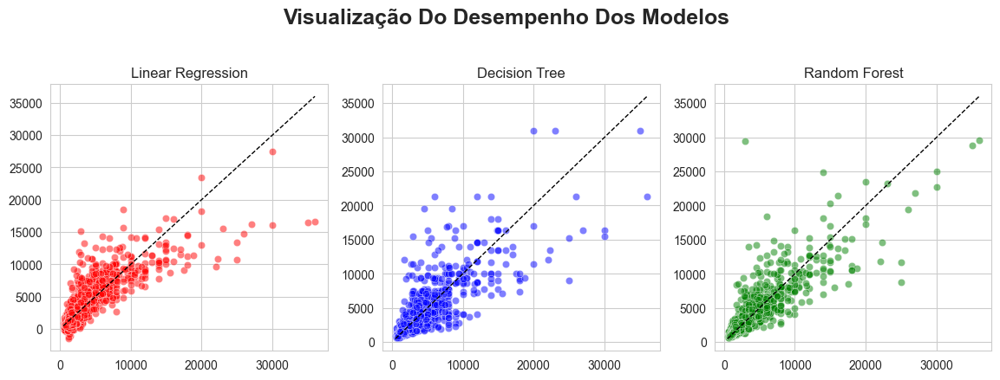

In [28]:
sns.set_style('whitegrid')
fig, ax = plt.subplots(nrows = 1, ncols=3, figsize=(14,4))

ax1 = plt.subplot(131)
ax1 = sns.scatterplot(x = y_test, y=y_pred_LR,color='red', alpha=.5,)
ax1.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1)
ax1.set(xlabel='')
plt.title('Linear Regression')

ax2 = plt.subplot(132)
ax2 = sns.scatterplot(x = y_test, y=y_pred_DT,color='blue', alpha=.5,)
ax2.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1)
ax2.set(xlabel='')
plt.title('Decision Tree')

ax3 = plt.subplot(133)
ax3 = sns.scatterplot(x = y_test, y=y_pred_RF, color='g', alpha=.5)
ax3.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1)
ax3.set(xlabel='')
plt.title('Random Forest')

plt.suptitle('Visualização do Desempenho dos modelos'.title(), fontsize=18, weight='black', y= 1.1)

plt.show()


**Explicando os gráficos acima.**

Cada gráfico representa um modelo. O eixo X de cada gráfico é composto pelos valores reais, já no eixo Y estão os valores previstos pelos modelos.
A linha pontilhada em cadas gráfico representa como seria a previsão perfeita.

Analisando os 3 gráficos, visualmente o Decision Tree e Random Forest se ajustaram um pouco melhor que o Linear Regression.



Vamos tentar melhorar nosso modelo. Quando voltamos a correlação das variáveis com o preço, percebemos que o dados de Latitude e Longitude praticamente não tinham correlação com o alvo. Sendo assim, vamos tirá-los dos nossos dados de treinamento e efetuar uma nova avaliação.

In [29]:
data_rent_refinado = data_rent_cleaned.drop(['Latitude','Longitude'], axis='columns')

In [30]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(data_rent_refinado, y, test_size=.3, random_state=99)

In [31]:
# Instanciando os modelos:

model_lr2 = LinearRegression()
model_dt2 = DecisionTreeRegressor()
model_rf2 = RandomForestRegressor()

In [32]:
# Criando as instancias do GridSearch:

grid_lr2 = GridSearchCV(model_lr2, param_grid_lr, cv=5)
grid_dt2 = GridSearchCV(model_dt2, param_grid_dt, cv=5)
grid_rf2 = GridSearchCV(model_rf2, param_grid_rf, cv=5)

In [33]:
# Treinando os modelos:
grid_lr2.fit(X_train2, y_train2)
grid_dt2.fit(X_train2, y_train2)
grid_rf2.fit(X_train2, y_train2)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [5, 10, 15, 20, None],
                         'min_samples_leaf': [1, 2, 4, 6],
                         'n_estimators': [10, 50, 100]})

In [34]:
# Avaliando o desempenho dos modelos com os dados de teste:

y_pred_LR2 = grid_lr2.predict(X_test2)
y_pred_DT2 = grid_dt2.predict(X_test2)
y_pred_RF2 = grid_rf2.predict(X_test2)
print(f'Linear Regression -  MSE: {mean_squared_error(y_test2, y_pred_LR2).round(3)} | MAE: {mean_absolute_error(y_test2, y_pred_LR2).round(3)} | Best Score: {grid_lr2.best_score_.round(2)}')
print(f'Decision Tree -  MSE: {mean_squared_error(y_test2, y_pred_DT2).round(3)} | MAE: {mean_absolute_error(y_test2, y_pred_DT2).round(3)} | Best Score: {grid_dt2.best_score_.round(3)}')
print(f'Random Forest - MSE: {mean_squared_error(y_test2, y_pred_RF2).round(3)} | MAE: {mean_absolute_error(y_test2, y_pred_RF2).round(3)} | Best Score: {grid_rf2.best_score_.round(3)}')


Linear Regression -  MSE: 0.0 | MAE: 0.0 | Best Score: 1.0
Decision Tree -  MSE: 2183.766 | MAE: 4.677 | Best Score: 0.999
Random Forest - MSE: 500.75 | MAE: 2.883 | Best Score: 0.999


In [35]:
# Encontrando o melhor modelo
best_model2 = grid_lr2.best_estimator_
best_params2 = grid_lr2.best_params_
if grid_dt2.best_score_ > grid_lr2.best_score_:
    best_model2 = grid_dt2.best_estimator_
    best_params2= grid_dt2.best_params_
elif grid_rf2.best_score_ > grid_dt2.best_score_:
    best_model2 = grid_rf2.best_estimator_
    best_params2 = grid_rf2.best_params_

# Imprimindo os resultados
print('Best Model:', best_model2)
print('Best Parameters:', best_params2)

Best Model: RandomForestRegressor(max_depth=15)
Best Parameters: {'max_depth': 15, 'min_samples_leaf': 1, 'n_estimators': 100}


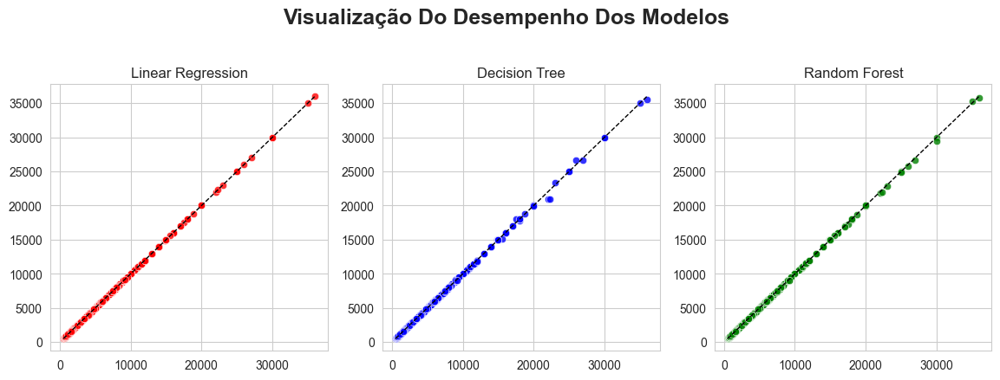

In [36]:
sns.set_style('whitegrid')

fig, ax = plt.subplots(nrows = 1, ncols=3, figsize=(14,4))

ax1 = plt.subplot(131)
ax1 = sns.scatterplot(x = y_test2, y=y_pred_LR2,color='red', alpha=.8,)
ax1.plot([y_test2.min(), y_test2.max()], [y_test2.min(), y_test2.max()], 'k--', lw=1)
ax1.set(xlabel='')
plt.title('Linear Regression')

ax2 = plt.subplot(132)
ax2 = sns.scatterplot(x = y_test2, y=y_pred_DT2,color='blue', alpha=.8,)
ax2.plot([y_test2.min(), y_test2.max()], [y_test2.min(), y_test2.max()], 'k--', lw=1)
ax2.set(xlabel='')
plt.title('Decision Tree')

ax3 = plt.subplot(133)
ax3 = sns.scatterplot(x = y_test2, y=y_pred_RF2, color='g', alpha=.8)
ax3.plot([y_test2.min(), y_test2.max()], [y_test2.min(), y_test2.max()], 'k--', lw=1)
ax3.set(xlabel='')
plt.title('Random Forest')

plt.suptitle('Visualização do Desempenho dos modelos'.title(), fontsize=18, weight='black', y= 1.1)


plt.show()


Após a exclusão das variáveis de localização (Latitude e Longitude) vimos que todos os modelos conseguiram fazer previsões com muito mais acurácia, com destaque a Regressão Linear.

## **Salvando o Modelo**

In [44]:
joblib.dump(grid_rf2, './models/grid_rf.pkl')

['./models/grid_rf.pkl']

## **Conclusão**

No primeiro teste dos modelos, observamos que a Random Forest obteve o melhor desempenho em relação às métricas de avaliação utilizadas (MSE e MAE) e também teve a melhor pontuação no cross-validation (0.73). No entanto, após excluir as variáveis de Latitude e Longitude do conjunto de teste, observamos que todos os modelos tiveram um desempenho muito superior, com pontuações perfeitas de 1.0 para a Regressão Linear e próximas a 1.0 para Decision Tree e Random Forest.

Isso indica que a inclusão das variáveis de Latitude e Longitude pode ter afetado negativamente o desempenho dos modelos e que essas variáveis podem não ser relevantes para prever o preço do imóvel. Portanto, podemos concluir que, para este conjunto de dados específico, as variáveis Rooms, Toilets, Suites, Parking, Elevator, Furnished e Swimming Pool são mais relevantes para prever o preço do imóvel. Além disso, o modelo Random Forest foi o que obteve o melhor desempenho geral e pode ser utilizado para prever preços de imóveis com base nessas variáveis.